<a href="https://colab.research.google.com/github/NgaNguyen87/nga/blob/master/Seg_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The objective of this work is to demonstrate how the segmentation classification tasks are carried out using Python. In this example, we used a sample image as a portion of an aerial photo collected by the US Department of Agriculture (USDA) under the National Agricultural Imagery Progam (NAIP) in 2012 in Texas with 1 meter - resolution. The ground truth points were generated randomly in ArcGIS.

In [ ]:
!pip install geopandas
import numpy as np
import gdal
import ogr
from skimage import exposure
from skimage.segmentation import quickshift
from skimage.segmentation import slic
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float
from skimage import io
import geopandas as gpd
import matplotlib.pyplot as plt
import argparse
import time
import scipy
gdal.UseExceptions()

     |████████████████████████████████| 1.0 MB 9.7 MB/s 
     |████████████████████████████████| 6.3 MB 16.1 MB/s 
     |████████████████████████████████| 15.4 MB 19.5 MB/s 


In [ ]:
#upload sampling shp and image to folder data
#from google.colab import files
#from IPython.display import Image
#uploaded = files.upload()

Saving naip12_clip1.tif to naip12_clip1.tif
Saving naip12_clip1.tif.ovr to naip12_clip1.tif.ovr
Saving naip12_clip1.tif.xml to naip12_clip1.tif.xml
Saving naip12_clip1.tif.aux.xml to naip12_clip1.tif.aux.xml
Saving naip12_clip1.tfw to naip12_clip1.tfw


In [18]:
#read image file
img_fn = '/content/data/naip12_clip1.tif'
driverTiff = gdal.GetDriverByName('GTiff')
img_ds = gdal.Open(img_fn)
nbands = img_ds.RasterCount
band_data = []
for i in range(1, nbands+1):
    band = img_ds.GetRasterBand(i).ReadAsArray()
    band_data.append(band)
band_data = np.dstack(band_data)
img = exposure.rescale_intensity(band_data)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: skimage.measure.label's indexing starts from 0. In future version it will start from 1. To disable this warning, explicitely set the `start_label` parameter to 1.
  This is separate from the ipykernel package so we can avoid doing imports until


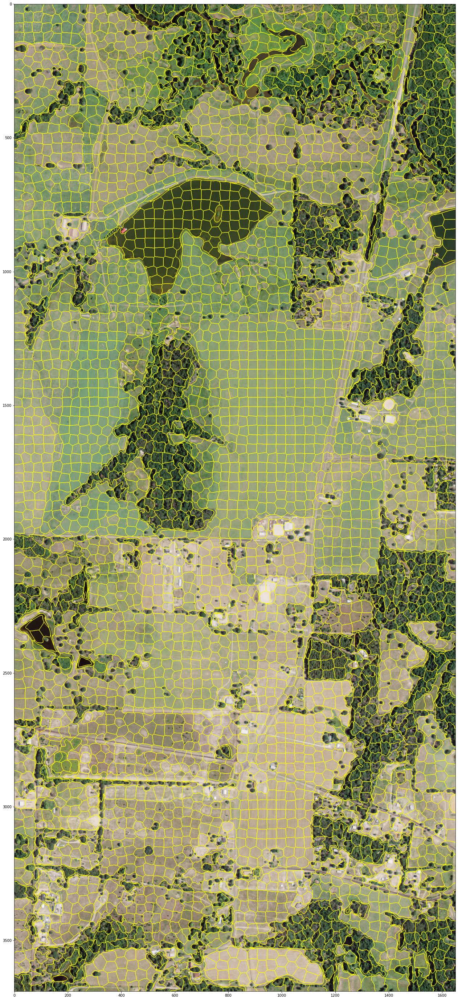

In [51]:
# run segmentation, using SLIC (Simple linear iterative clustering)
seg_start = time.time()
segments = slic(img, n_segments=5000, sigma = 5)

# display segmentation over image file 
plt.rcParams['figure.figsize'] = [250, 50]
plt.imshow(mark_boundaries(img, segments,mode='thick'))


In [52]:
#extract spectral value for segments
def segment_features(segment_pixels):
    features = []
    npixels, nbands = segment_pixels.shape
    for b in range(nbands):
        stats = scipy.stats.describe(segment_pixels[:, b])
        band_stats = list(stats.minmax) + list(stats)[2:]
        if npixels == 1:
            # in this case the variance = nan, change it 0.0
            band_stats[3] = 0.0
        features += band_stats
    return features
segment_ids = np.unique(segments)
objects = []
object_ids = []
for id in segment_ids:
    segment_pixels = img[segments == id]
    object_features = segment_features(segment_pixels)
    objects.append(object_features)
    object_ids.append(id)

In [53]:
import pandas as pd

# read sampling shapefile 
gdf = gpd.read_file('/content/data/sampling.shp')
class_names = gdf['Label'].unique()
print('class names', class_names)
class_ids = np.arange(class_names.size) + 1


# split the ground truth data into training and test data sets 
gdf_train = gdf.sample(frac=0.7)
gdf_test = gdf.drop(gdf_train.index)
print('gdf shape', gdf.shape, 'training shape', gdf_train.shape, 'test', gdf_test.shape)
gdf_train.to_file('training.shp')
gdf_test.to_file('testing.shp')

class names ['grassland' 'forest' 'urban' 'bare/argiland' 'surface water']
gdf shape (100, 3) training shape (70, 3) test (30, 3)


In [60]:
img_ds = gdal.Open(img_fn)
train_fn = 'training.shp'
train_ds = ogr.Open(train_fn)
lyr = train_ds.GetLayer()

# create a new raster layer for training points in memory
driver = gdal.GetDriverByName('MEM')
training_raster = driver.Create('', img_ds.RasterXSize, img_ds.RasterYSize, 1, gdal.GDT_UInt16)
training_raster.SetGeoTransform(img_ds.GetGeoTransform())
training_raster.SetProjection(img_ds.GetProjection())
options = ['ATTRIBUTE=id']
gdal.RasterizeLayer(training_raster, [1], lyr, options=options)



0

In [55]:
#Intersect segments with land cover classification type 
ground_truth = training_raster.GetRasterBand(1).ReadAsArray()

classes = np.unique(ground_truth)[1:]
segments_per_class = {}
for klass in classes:
    segments_class = segments[ground_truth == klass]
    segments_per_class[klass] = set(segments_class)
    print("Training segments of class", klass, ":", len(segments_class))

intersection = set()
accum = set()
for class_segs in segments_per_class.values():
    intersection |= accum.intersection(class_segs)
    accum |= class_segs
assert len(intersection) == 0, "Segment(s) represent multiple classes" #check if segment represents more than one class.

Training segments of class 1 : 24
Training segments of class 2 : 20
Training segments of class 3 : 7
Training segments of class 4 : 14
Training segments of class 5 : 5


In [56]:
#Run supervised classification for segments with Random Forest Classsifier
train_img = np.copy(segments)
threshold = train_img.max() + 1

for klass in classes:
    class_label = threshold + klass
    for segment_id in segments_per_class[klass]:
        train_img[train_img == segment_id] = class_label

train_img[train_img <= threshold] = 0
train_img[train_img > threshold] -= threshold

training_objects = []
training_labels = []

for klass in classes:
    class_train_object = [v for i, v in enumerate(objects) if segment_ids[i] in segments_per_class[klass]]
    training_labels += [klass] * len(class_train_object)
    training_objects += class_train_object
    print('Training objects for class', klass, ':', len(class_train_object))

from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_jobs=-1)
classifier.fit(training_objects, training_labels)
print('Fitting Random Forest Classifier')
predicted = classifier.predict(objects)
print('Predicting Classifications')
clf = np.copy(segments)
for segment_id, klass in zip(segment_ids, predicted):
    clf[clf == segment_id] = klass
print('Applying Prediction')

mask = np.sum(img, axis=2)
mask[mask > 0.0] = 1.0
mask[mask == 0.0] = -1.0
clf = np.multiply(clf, mask)
clf[clf < 0] = -9999.0
#plt.imshow(mark_boundaries(img, clf,mode='thick'))

Training objects for class 1 : 24
Training objects for class 2 : 20
Training objects for class 3 : 7
Training objects for class 4 : 14
Training objects for class 5 : 5
Fitting Random Forest Classifier
Predicting Classifications
Applying Prediction


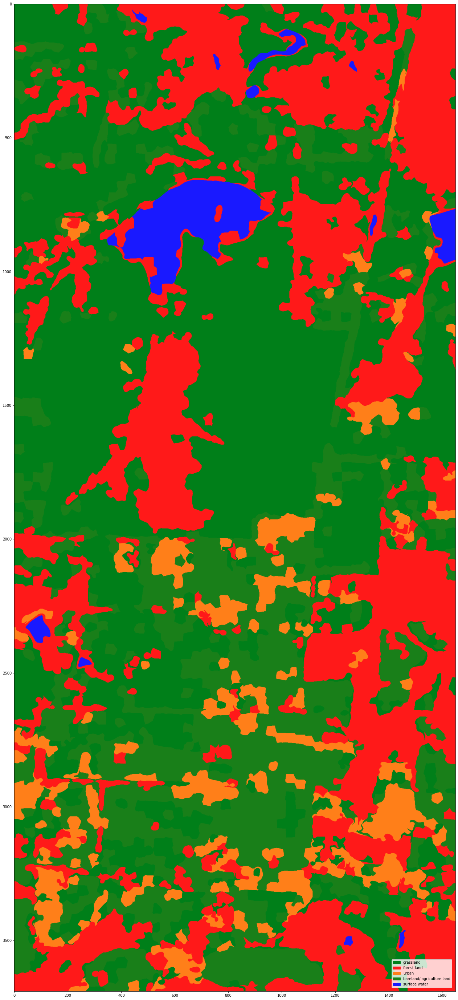

In [58]:
import matplotlib.patches as mpatches
labels = {1:'grassland',2:'forest land',3:'urban',4:'bareland/ agriculture land',5:'surface water'}
cmap = {1:[0.0,0.5,0.1,1],2:[1.0,0.1,0.1,1],3:[1.0,0.5,0.1,1],4:[0.1,0.5,0.1,1],5:[0.1,0.1,1.0,1]}
arrayShow = np.array([[cmap[i] for i in j] for j in clf])    
## create patches as legend
patches =[mpatches.Patch(color=cmap[i],label=labels[i]) for i in cmap]
plt.imshow(arrayShow)
plt.legend(handles=patches, loc=4, borderaxespad=1.)
plt.show()

Accuracy assessment with confusion matrix

In [57]:

from sklearn import metrics
test_fn = 'testing.shp'
test_ds = ogr.Open(test_fn)
lyr = test_ds.GetLayer()
driver = gdal.GetDriverByName('MEM')
test_raster = driver.Create('', img_ds.RasterXSize, img_ds.RasterYSize, 1, gdal.GDT_UInt16)
test_raster.SetGeoTransform(img_ds.GetGeoTransform())
test_raster.SetProjection(img_ds.GetProjection())
options = ['ATTRIBUTE=id']
gdal.RasterizeLayer(test_raster, [1], lyr, options=options)

truth = test_raster.GetRasterBand(1).ReadAsArray()
pred=clf
idx = np.nonzero(truth)

confusion_mat = metrics.confusion_matrix(truth[idx], pred[idx])
print(confusion_mat)
accuracy = confusion_mat.diagonal() / confusion_mat.sum(axis=0)
print(accuracy)

[[9 1 0 1 0]
 [1 6 0 0 0]
 [0 0 1 0 0]
 [2 1 0 3 0]
 [0 0 0 0 5]]
[0.75 0.75 1.   0.75 1.  ]
